<a href="https://colab.research.google.com/github/alinecdet/csc725/blob/main/NoiseInVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Gaussian noise**

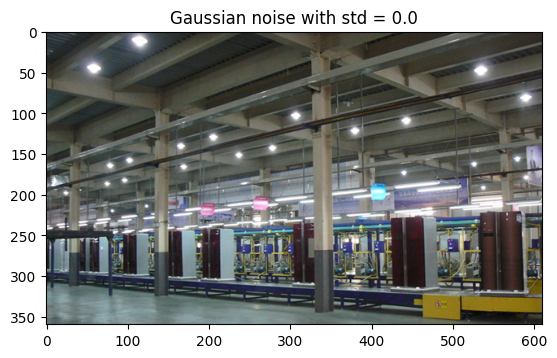

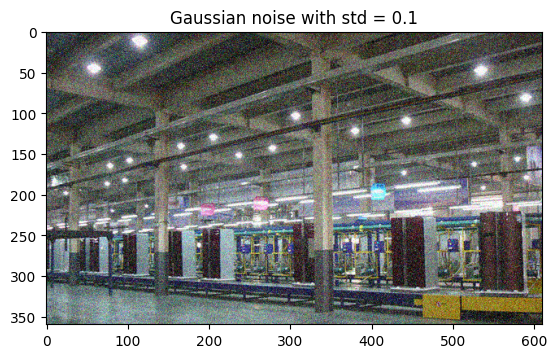

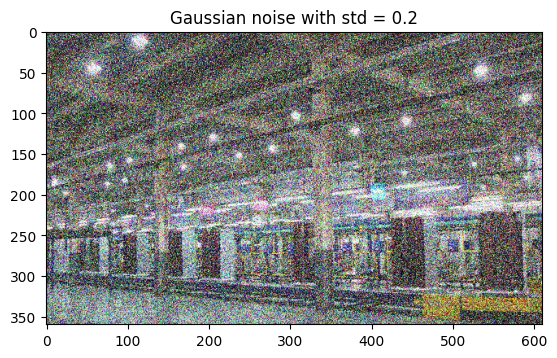

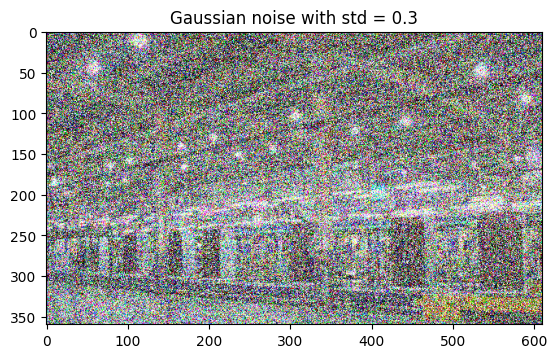

In [128]:
# prompt: add Gaussian noise to the image with standard deviation 0, 0.1, 0.3, 0.5 and print

import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Add Gaussian noise with different standard deviations
noisy_images = []
for std in [0, 0.1, 0.3, 0.5]:
  noise = np.random.normal(scale=std, size=image.shape)
  noisy_image = image + noise
  noisy_images.append(noisy_image)

# Print the noisy images
for i, noisy_image in enumerate(noisy_images):
  plt.imshow(noisy_image)
  plt.title(f"Gaussian noise with std = {i/10}")
  plt.show()


**Rayleigh noise**

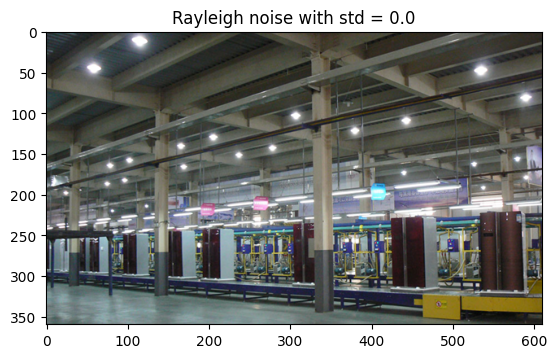

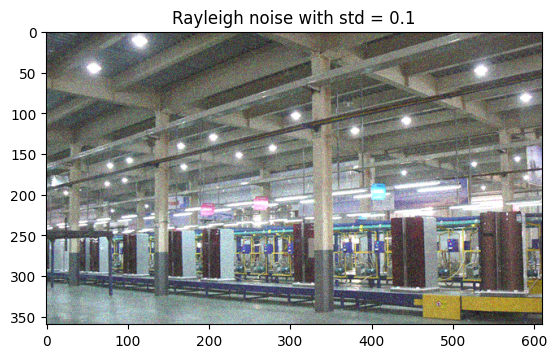

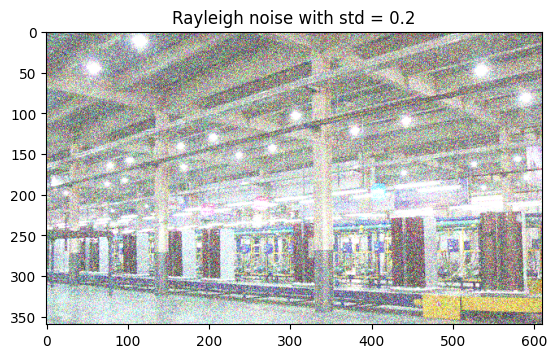

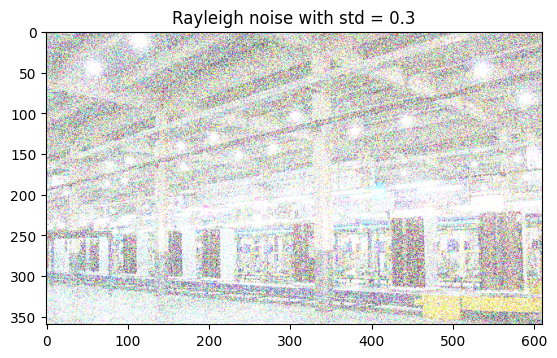

In [129]:
# prompt: add Rayleigh noise to the image with standard deviation 0, 0.1, 0.3, 0.5 and print

import numpy as np
import matplotlib.pyplot as plt
# **Rayleigh noise**

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Add Rayleigh noise with different standard deviations
noisy_images = []
for std in [0, 0.1, 0.3, 0.5]:
  noise = np.random.rayleigh(scale=std, size=image.shape)
  noisy_image = image + noise
  noisy_images.append(noisy_image)

# Print the noisy images
for i, noisy_image in enumerate(noisy_images):
  plt.imshow(noisy_image)
  plt.title(f"Rayleigh noise with std = {i/10}")
  plt.show()


**Uniform noise**

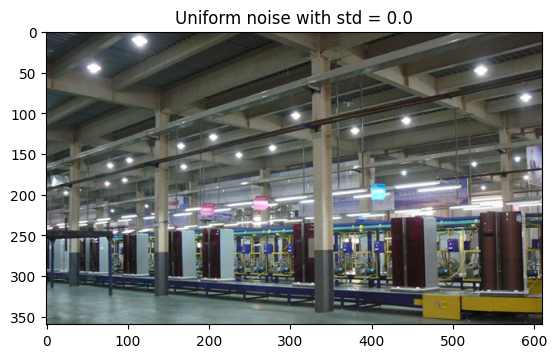

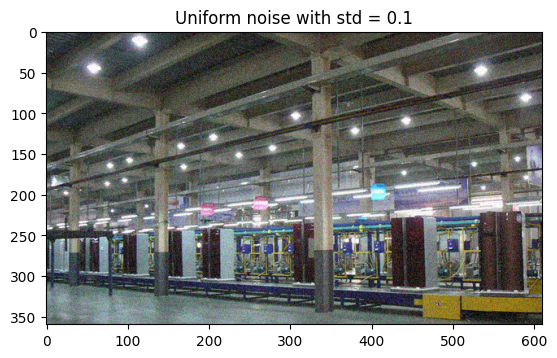

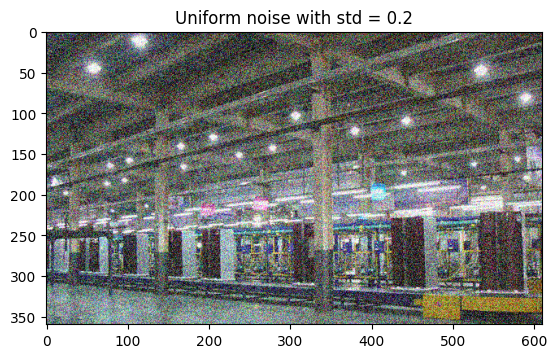

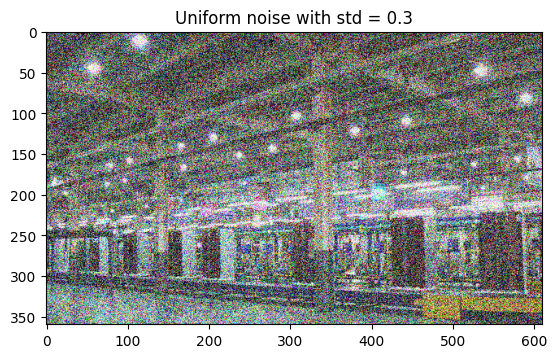

In [130]:
# prompt: add Uniform noise to the image with standard deviation 0, 0.1, 0.3, 0.5 and print

# **Uniform noise**

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Add Uniform noise with different standard deviations
noisy_images = []
for std in [0, 0.1, 0.3, 0.5]:
  noise = np.random.uniform(low=-std, high=std, size=image.shape)
  noisy_image = image + noise
  noisy_images.append(noisy_image)

# Print the noisy images
for i, noisy_image in enumerate(noisy_images):
  plt.imshow(noisy_image)
  plt.title(f"Uniform noise with std = {i/10}")
  plt.show()


**Salt-and-pepper (impulse) noise**

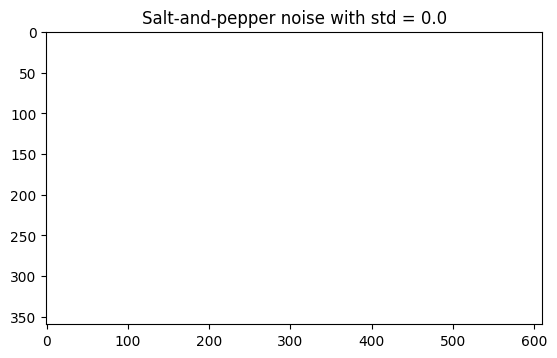

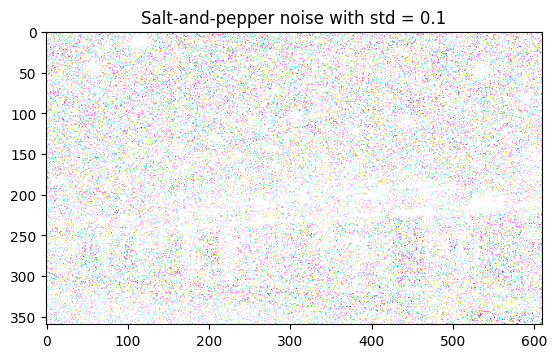

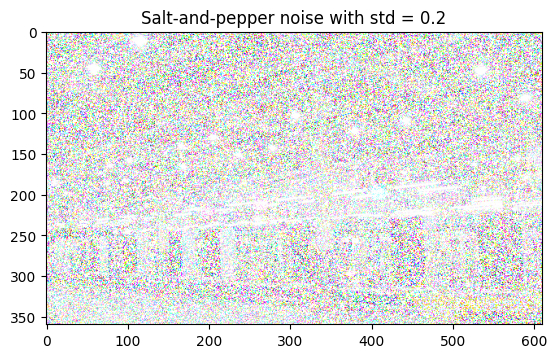

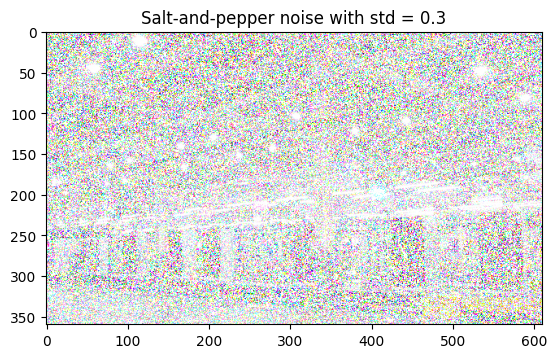

In [131]:
# prompt: add Salt-and-pepper (impulse) noise to the image with standard deviation 0, 0.1, 0.3, 0.5 and print

# **Salt-and-pepper (impulse) noise**

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Add Salt-and-pepper (impulse) noise with different standard deviations
noisy_images = []
for std in [0, 0.1, 0.3, 0.5]:
  noise = np.random.randint(low=0, high=256, size=image.shape, dtype=np.uint8)
  noise[np.random.random(size=image.shape) > std] = 0
  noise[np.random.random(size=image.shape) > std] = 255
  noisy_image = image + noise
  noisy_images.append(noisy_image)

# Print the noisy images
for i, noisy_image in enumerate(noisy_images):
  plt.imshow(noisy_image)
  plt.title(f"Salt-and-pepper noise with std = {i/10}")
  plt.show()


**Erlang (gamma) noise**

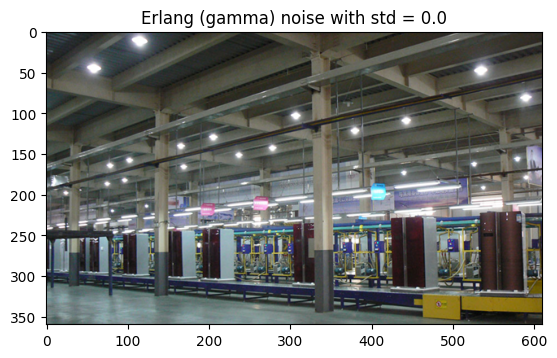

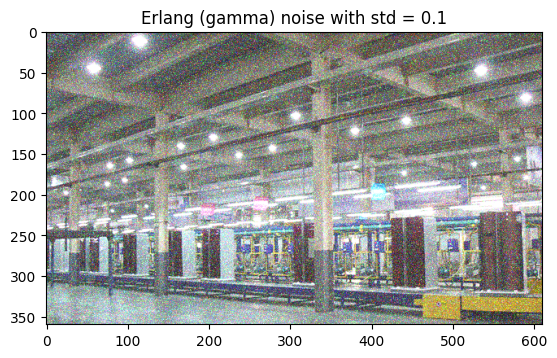

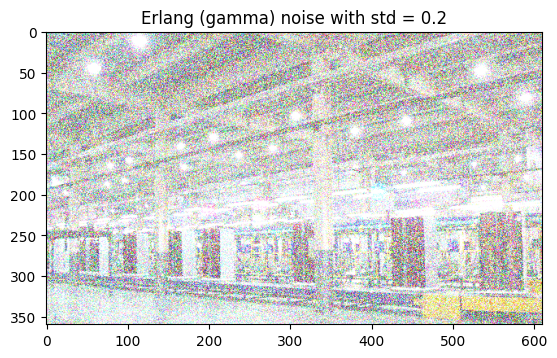

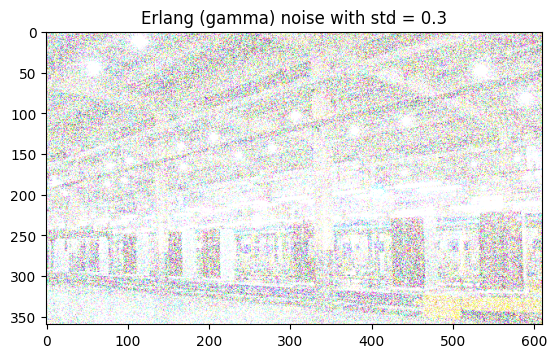

In [132]:
# prompt: add Erlang (gamma) noise to the image with standard deviation 0, 0.1, 0.3, 0.5 and print

# **Erlang (gamma) noise**

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Add Erlang (gamma) noise with different standard deviations
noisy_images = []
for std in [0, 0.1, 0.3, 0.5]:
  noise = np.random.gamma(shape=2, scale=std, size=image.shape)
  noisy_image = image + noise
  noisy_images.append(noisy_image)

# Print the noisy images
for i, noisy_image in enumerate(noisy_images):
  plt.imshow(noisy_image)
  plt.title(f"Erlang (gamma) noise with std = {i/10}")
  plt.show()


**Estimation of a noise parameters from a single image**

In [133]:
# prompt: Estimate noise parameters from a the image and print them

# Import libraries
import numpy as np

# Load the image
image = plt.imread("/content/Production-Line-Ref.jpg")

# Estimate the noise parameters
noise_params = {}

# Gaussian noise
noise_params["gaussian"] = np.std(image)

# Rayleigh noise
noise_params["rayleigh"] = np.sqrt(2) * np.mean(np.abs(image - np.mean(image)))

# Uniform noise
noise_params["uniform"] = 3 * np.mean(np.abs(image - np.mean(image)))

# Salt-and-pepper (impulse) noise
noise_params["salt_and_pepper"] = np.mean(np.abs(image - np.mean(image)))

# Erlang (gamma) noise
noise_params["erlang"] = 2 * np.mean(image) / np.std(image)

# Print the noise parameters
for noise_type, noise_param in noise_params.items():
  print(f"{noise_type} noise parameter: {noise_param}")


gaussian noise parameter: 0.3201465904712677
rayleigh noise parameter: 0.3919403608953595
uniform noise parameter: 0.8314310610294342
salt_and_pepper noise parameter: 0.2771436870098114
erlang noise parameter: 3.2376176617806722


**Apply a class of mean**

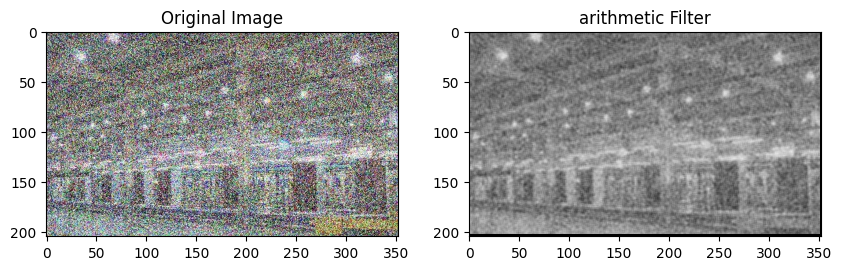

In [139]:
# prompt: Apply a class of mean (Arithmetic, weighted mean, Geometric, mean filter) filter on a given generated noisy image

import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = plt.imread("/content/Gaus-05.jpg")

# Define the filter size
filter_size = 3

# Define the filter type
filter_type = "arithmetic"

# Apply the filter
if filter_type == "arithmetic":
  filtered_image = np.zeros_like(image)
  for i in range(image.shape[0] - filter_size + 1):
    for j in range(image.shape[1] - filter_size + 1):
      filtered_image[i, j] = np.mean(image[i:i+filter_size, j:j+filter_size])
elif filter_type == "weighted_mean":
  weights = np.ones((filter_size, filter_size))
  weights[1, 1] = 2
  filtered_image = np.zeros_like(image)
  for i in range(image.shape[0] - filter_size + 1):
    for j in range(image.shape[1] - filter_size + 1):
      filtered_image[i, j] = np.sum(image[i:i+filter_size, j:j+filter_size] * weights) / np.sum(weights)
elif filter_type == "geometric":
  filtered_image = np.zeros_like(image)
  for i in range(image.shape[0] - filter_size + 1):
    for j in range(image.shape[1] - filter_size + 1):
      filtered_image[i, j] = np.prod(image[i:i+filter_size, j:j+filter_size]) ** (1 / (filter_size * filter_size))
elif filter_type == "mean_filter":
  filtered_image = np.zeros_like(image)
  for i in range(image.shape[0] - filter_size + 1):
    for j in range(image.shape[1] - filter_size + 1):
      filtered_image[i, j] = np.median(image[i:i+filter_size, j:j+filter_size])

# Show the original and filtered images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap="gray")
plt.title(f"{filter_type} Filter")
plt.show()



**Implement the adaptive, local noise reduction filter**

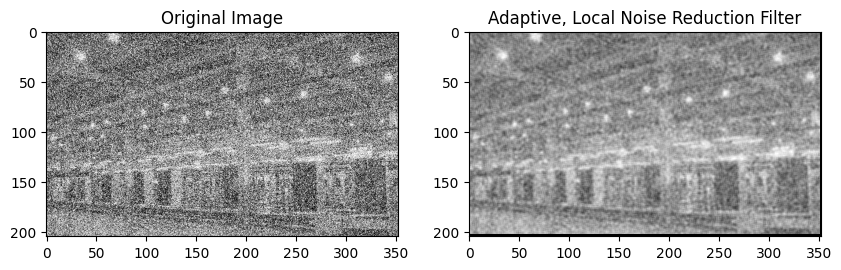

In [141]:
# prompt: Implement adaptive, local noise reduction filter to the given noise image and print

import numpy as np
import cv2

# Load the image
image = cv2.imread("/content/Gaus-05.jpg", 0)

# Define the filter size
filter_size = 3

# Define the noise standard deviation
noise_std = 0.1

# Calculate the noise variance
noise_var = noise_std ** 2

# Initialize the filtered image
filtered_image = np.zeros_like(image)

# Iterate over the image
for i in range(image.shape[0] - filter_size + 1):
  for j in range(image.shape[1] - filter_size + 1):
    # Extract the local neighborhood
    neighborhood = image[i:i+filter_size, j:j+filter_size]

    # Calculate the local mean and variance
    local_mean = np.mean(neighborhood)
    local_var = np.var(neighborhood)

    # Calculate the adaptive filter coefficient
    alpha = min(1, noise_var / local_var)

    # Apply the filter
    filtered_image[i, j] = local_mean + alpha * (image[i, j] - local_mean)

# Show the original and filtered images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap="gray")
plt.title("Adaptive, Local Noise Reduction Filter")
plt.show()
